In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Распакуем архив
#! unzip /content/drive/MyDrive/Wamiq/VOC2028.zip -d /content/drive/MyDrive/Wamiq/

In [ ]:
# ! unzip /content/drive/MyDrive/anti_collision/VOC2028-20230613T085022Z-001.zip -d /content/drive/MyDrive/anti_collision/

# Загрузка данных и разделение на train и validation

In [ ]:
%cd /content/drive/MyDrive/anti_collision/VOC2028

/content/drive/MyDrive/anti_collision/VOC2028


In [ ]:
%ls

images/  ImageSets/  labels/


## Not in use

In [ ]:
# Количество изображений в папке
import os
folder_path = "/content/drive/MyDrive/anti_collision/VOC2028/images/"
files = os.listdir(folder_path)
num_files = len(files)

print(f"There are {num_files} files in the folder {folder_path}.")

There are 2 files in the folder /content/drive/MyDrive/anti_collision/VOC2028/images/.


In [ ]:
import random
import shutil
# Для разделения картинок
# Define the paths to the main directory and the subdirectories
main_dir = '/content/drive/MyDrive/anti_collision/VOC2028/images/'
train_dir = os.path.join(main_dir, 'train')
val_dir = os.path.join(main_dir, 'val')

# Создание директорий
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Список всех файлов изображений в основной папке
image_files = [os.path.join(main_dir, f) for f in os.listdir(main_dir) if f.endswith('.jpg')]

# 20% для valid
val_size = int(0.2 * len(image_files))

#
val_images = random.sample(image_files, val_size)

# Перемещаем в папку valid
for image in val_images:
    shutil.move(image, os.path.join(val_dir, os.path.basename(image)))

# Перемещаем в папку train
for image in os.listdir(main_dir):
    if os.path.isfile(os.path.join(main_dir, image)):
        shutil.move(os.path.join(main_dir, image), os.path.join(train_dir, image))

In [ ]:
#Проверяем количество файлов папке train
import os
folder_path = "/content/drive/MyDrive/anti_collision/VOC2028/JPEGImages/train"
files = os.listdir(folder_path)
num_files = len(files)

print(f"There are {num_files} files in the folder {folder_path}.")

In [ ]:
#Проверяем количество файлов папке train
import os
folder_path = "/content/drive/MyDrive/anti_collision/VOC2028/JPEGImages/val"
files = os.listdir(folder_path)
num_files = len(files)

print(f"There are {num_files} files in the folder {folder_path}.")

In [ ]:
# Разделение для аннотаций
import shutil

# Определяем пути к основной папке, аннотациям и train, val
main_dir = '/content/drive/MyDrive/anti_collision/VOC2028/JPEGImages/'
anno_dir = '/content/drive/MyDrive/anti_collision/VOC2028/Annotations/'
train_dir = os.path.join(main_dir, 'train')
val_dir = os.path.join(main_dir, 'val')
train_anno_dir = os.path.join(anno_dir, 'train')
val_anno_dir = os.path.join(anno_dir, 'val')

#  Создаем субпапки, если их еще нет
os.makedirs(train_anno_dir, exist_ok=True)
os.makedirs(val_anno_dir, exist_ok=True)

# Получим список всех файлов изображений
val_images = [os.path.join(val_dir, f) for f in os.listdir(val_dir) if f.endswith('.jpg')]

# Перемещаем соответствующие файлы аннотаций в папку меток
for image in val_images:
    image_base = os.path.basename(image)
    image_anno = os.path.join(anno_dir, image_base[:-4] + '.xml')
    if os.path.exists(image_anno):
        shutil.move(image_anno, os.path.join(val_anno_dir, os.path.basename(image_anno)))

#  Список всех файлов изображений
train_images = [os.path.join(train_dir, f) for f in os.listdir(train_dir) if f.endswith('.jpg')]

# Соответствующие файлы аннотаций меток
for image in train_images:
    image_base = os.path.basename(image)
    image_anno = os.path.join(anno_dir, image_base[:-4] + '.xml')
    if os.path.exists(image_anno):
        shutil.move(image_anno, os.path.join(train_anno_dir, os.path.basename(image_anno)))

In [ ]:
# Замена значений в txt файл
import xml.etree.ElementTree as ET

# указываем директорию с файлами xml
xml_dir = "/content/drive/MyDrive/Wamiq/anti_collision/Annotations/train/"

# цикл по каждому файлу в каталоге
for filename in os.listdir(xml_dir):
    if filename.endswith(".xml"):
        # parse the xml file
        tree = ET.parse(os.path.join(xml_dir, filename))
        root = tree.getroot()

        # Итоговый файл
        output_filename = filename.replace(".xml", ".txt")
        output_file = open(os.path.join(xml_dir, output_filename), "w")

        # цикл по каждому объекту в файле xml
        for obj in root.findall("object"):
            # get the class label
            cls = obj.find("name").text
            id_class = 1 if cls == "hat" else 0

            # координаты bounding box
            bbox = obj.find("bndbox")
            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            # Размер изображения
            size = root.find("size")
            width_image = int(size.find("width").text)
            height_image = int(size.find("height").text)

            # Вычисляем координаты
            x_center = (xmin + xmax) / 2 / width_image
            y_center = (ymin + ymax) / 2 / height_image
            box_width = (xmax - xmin) / width_image
            box_height = (ymax - ymin) / height_image

            # Информация о bounding box
            output_file.write(f"{id_class} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:.6f}\n")


        output_file.close()


In [ ]:
# Количество изображений в папке train после разделения
folder_path = "/content/drive/MyDrive/Wamiq/anti_collision/Annotations/train/"
files = os.listdir(folder_path)
num_files = len(files)

print(f"There are {num_files} files in the folder {folder_path}.")

There are 6067 files in the folder /content/drive/MyDrive/Wamiq/VOC2028/Annotations/train/.


In [ ]:
# Замена значений в txt файл
# указываем директорию с файлами xml
xml_dir = "/content/drive/MyDrive/Wamiq/VOC2028/Annotations/val/"

# цикл по каждому файлу в каталоге
for filename in os.listdir(xml_dir):
    if filename.endswith(".xml"):
        # parse the xml file
        tree = ET.parse(os.path.join(xml_dir, filename))
        root = tree.getroot()

        # Итоговый файл
        output_filename = filename.replace(".xml", ".txt")
        output_file = open(os.path.join(xml_dir, output_filename), "w")

        # цикл по каждому объекту в файле xml
        for obj in root.findall("object"):
            # get the class label
            cls = obj.find("name").text
            id_class = 1 if cls == "hat" else 0

            # координаты bounding box
            bbox = obj.find("bndbox")
            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            # Размер изображения
            size = root.find("size")
            width_image = int(size.find("width").text)
            height_image = int(size.find("height").text)

            # Вычисляем координаты
            x_center = (xmin + xmax) / 2 / width_image
            y_center = (ymin + ymax) / 2 / height_image
            box_width = (xmax - xmin) / width_image
            box_height = (ymax - ymin) / height_image

            # Информация о bounding box
            output_file.write(f"{id_class} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:.6f}\n")


        output_file.close()


In [ ]:
%pwd

'/content'

In [ ]:
folder_path = "/content/drive/MyDrive/Wamiq/VOC2028/Annotations/val/"
files = os.listdir(folder_path)
num_files = len(files)

print(f"There are {num_files} files in the folder {folder_path}.")

In [ ]:
# #Удалим файлы xml
# import glob

# folder_path = "/content/drive/MyDrive/Wamiq/VOC2028/Annotations/train/"

# for file_path in glob.glob(os.path.join(folder_path, "*.xml")):
#     os.remove(file_path)
#     print(f"Deleted {file_path}")


In [ ]:
# folder_path = "/content/drive/MyDrive/Wamiq/VOC2028/Annotations/val/"

# for file_path in glob.glob(os.path.join(folder_path, "*.xml")):
#     os.remove(file_path)
#     print(f"Deleted {file_path}")


# Yolov7

In [ ]:
%cd /content/drive/MyDrive/anti_collision/VOC2028

/content/drive/MyDrive/anti_collision/VOC2028


In [ ]:
!pwd

/content/drive/MyDrive/anti_collision/VOC2028


In [ ]:
# Скачаем Yolov7
!git clone https://github.com/WongKinYiu/yolov7.git

Cloning into 'yolov7'...
remote: Enumerating objects: 1185, done.
remote: Total 1185 (delta 0), reused 0 (delta 0), pack-reused 1185
Receiving objects: 100% (1185/1185), 74.23 MiB | 16.79 MiB/s, done.
Resolving deltas: 100% (512/512), done.
Updating files: 100% (108/108), done.


In [ ]:
%cd /content/drive/MyDrive/anti_collision/VOC2028/yolov7/

/content/drive/MyDrive/anti_collision/VOC2028/yolov7


In [ ]:
# !wget 'https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt '

In [ ]:
!pip3 install -r yolov7/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 61.9 MB/s eta 0:00:00


In [ ]:
# train p5 models
!python train.py --workers 8 --device 0 --batch-size 32 --data data/coco.yaml --img 640 640 --cfg cfg/training/yolov7.yaml --weights '' --name yolov7 --hyp data/hyp.scratch.p5.yaml

2023-06-13 09:29:47.073746: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-13 09:29:47.953973: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
YOLOR 🚀 v0.1-126-g84932d7 torch 2.0.1+cu118 CUDA:0 (Tesla T4, 15101.8125MB)

Namespace(weights='', cfg='cfg/training/yolov7.yaml', data='data/coco.yaml', hyp='data/hyp.scratch.p5.yaml', epochs=300, batch_size=32, img_size=[640, 640], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket='', cache_images=False, image_weights=False, device='0', multi_scale=False, single_cls=False, adam=False, sync_bn=False, local_rank=-1, workers=8, project='runs/train', entity=None, name='yolov7', exist_ok=False, quad=False, linear_lr=

In [ ]:
# train p5 models
!python train.py --workers 8 --device 0 --batch-size 32 --data data/coco.yaml --img 640 640 --cfg cfg/training/yolov7.yaml --weights '' --name yolov7 --hyp data/hyp.scratch.p5.yaml

2023-06-13 09:46:26.265022: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-13 09:46:27.729276: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
YOLOR 🚀 v0.1-126-g84932d7 torch 2.0.1+cu118 CUDA:0 (Tesla T4, 15101.8125MB)

Namespace(weights='', cfg='cfg/training/yolov7.yaml', data='data/coco.yaml', hyp='data/hyp.scratch.p5.yaml', epochs=300, batch_size=32, img_size=[640, 640], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket='', cache_images=False, image_weights=False, device='0', multi_scale=False, single_cls=False, adam=False, sync_bn=False, local_rank=-1, workers=8, project='runs/train', entity=None, name='yolov7', exist_ok=False, quad=False, linear_lr=

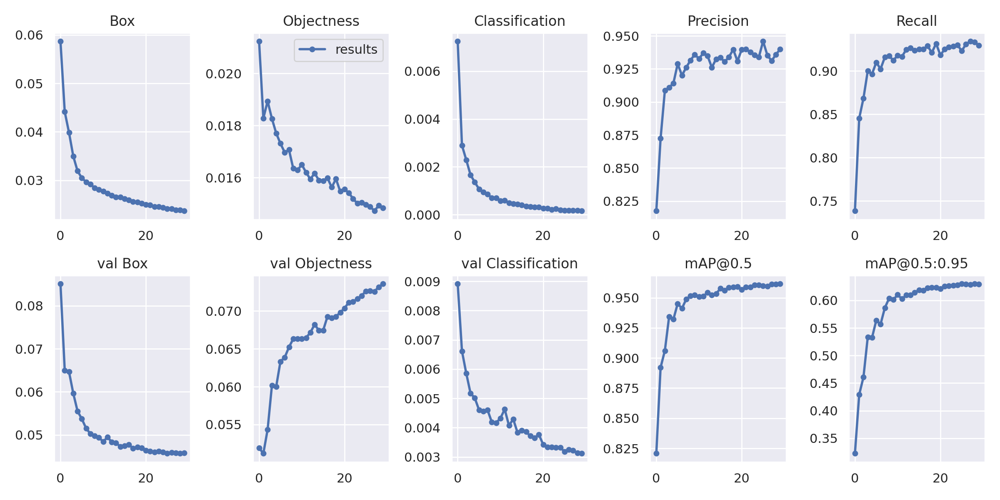

In [ ]:
from PIL import Image, ImageOps
Image.open("/content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom2/results.png")

In [ ]:
import tensorflow as tf
import datetime, os

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Wamiq/yolov7/runs/train'

<IPython.core.display.Javascript object>

In [ ]:
!# Detection confidence threshold = 0.6
!python /content/drive/MyDrive/Wamiq/yolov7/detect.py --weights /content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom2/weights/best.pt --conf 0.6 --img-size 640 --source /content/drive/MyDrive/Wamiq/test_images

Namespace(weights=['/content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom2/weights/best.pt'], source='/content/drive/MyDrive/Wamiq/test_images', img_size=640, conf_thres=0.6, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40513.5625MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 306 layers, 36485311 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Tra

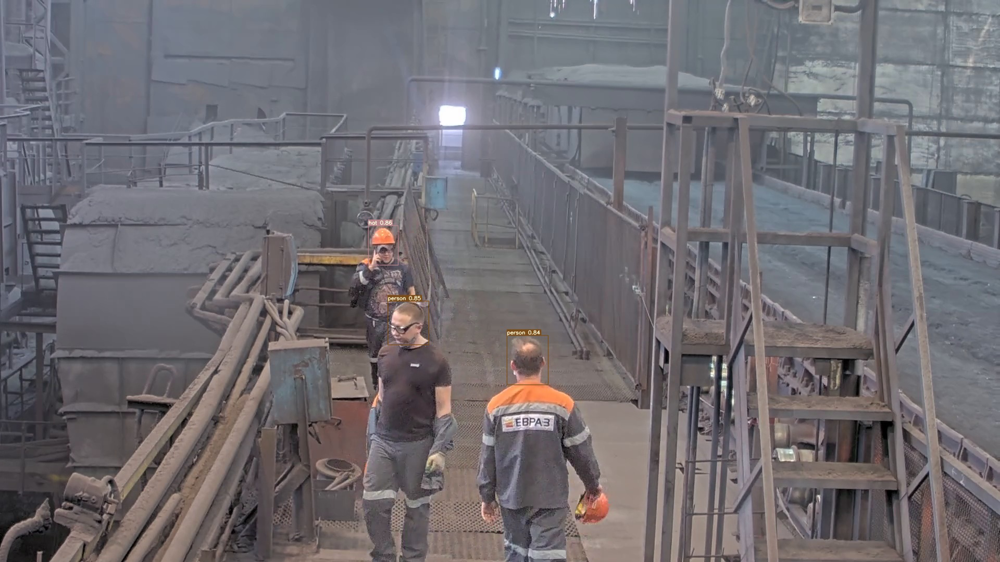

In [ ]:
Image.open("/content/drive/MyDrive/Wamiq/yolov7/runs/detect/exp/am3_9_frame109.jpg")

In [ ]:
!python /content/drive/MyDrive/Wamiq/yolov7/detect.py --weights /content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom2/weights/best.pt --conf 0.6 --img-size 640 --source /content/drive/MyDrive/Wamiq/test_images_9

Namespace(weights=['/content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom2/weights/best.pt'], source='/content/drive/MyDrive/Wamiq/test_images_9', img_size=640, conf_thres=0.6, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40513.5625MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36485311 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgr

In [ ]:
%cd /content/drive/MyDrive/Wamiq/yolov7/

/content/drive/MyDrive/Wamiq/yolov7


In [ ]:
!python train.py --workers 1 --device 0 --batch-size 16 --epochs 30 --img 640 640 --hyp data/hyp.scratch.custom.yaml --name yolov7-custom --weights yolov7.pt

2023-04-06 21:23:01.194827: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-04-06 21:23:01.250955: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-06 21:23:02.172200: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40513.5625MB)

Namespace(weights='yolov7.pt', cfg='', data='data/coco.yaml', hyp='data/hyp.scratch.custom.yaml', epochs=30, batch_size=16, img_size=[640, 640], rect=False, res

In [ ]:
!# Detection confidence threshold = 0.6
!python /content/drive/MyDrive/Wamiq/yolov7/detect.py --weights /content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom5/weights/best.pt --conf 0.6 --img-size 640 --source /content/drive/MyDrive/Wamiq/test_images

Namespace(weights=['/content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom5/weights/best.pt'], source='/content/drive/MyDrive/Wamiq/test_images', img_size=640, conf_thres=0.6, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40513.5625MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36485311 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid

In [ ]:
Image.open("/content/drive/MyDrive/Wamiq/yolov7/runs/detect/exp3/am3_9_frame109.jpg")

NameError: ignored

In [ ]:
!# Detection confidence threshold = 0.6
!python /content/drive/MyDrive/Wamiq/yolov7/detect.py --weights /content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom5/weights/best.pt --conf 0.6 --img-size 640 --source /content/drive/MyDrive/Wamiq/test_images_9

Namespace(weights=['/content/drive/MyDrive/Wamiq/yolov7/runs/train/yolov7-custom5/weights/best.pt'], source='/content/drive/MyDrive/Wamiq/test_images_9', img_size=640, conf_thres=0.6, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40513.5625MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36485311 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgr